In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
import torchvision.models as models

import copy

In [2]:
plt.rcParams["figure.figsize"] = [15, 10]

In [3]:
torch.cuda.is_available()

True

In [4]:
device = torch.device("cuda")

In [5]:
# imsize = 960
imsize = 256

loader = transforms.Compose([
    transforms.Resize(imsize),
    transforms.ToTensor()
])

def image_loader(image_name):
    image = Image.open(image_name)
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)

style_img = image_loader("images/ukiyo-e2.jpg")
content_img = image_loader("images/boston evening.jpg")

assert style_img.size() == content_img.size(), "images must be same size"
    

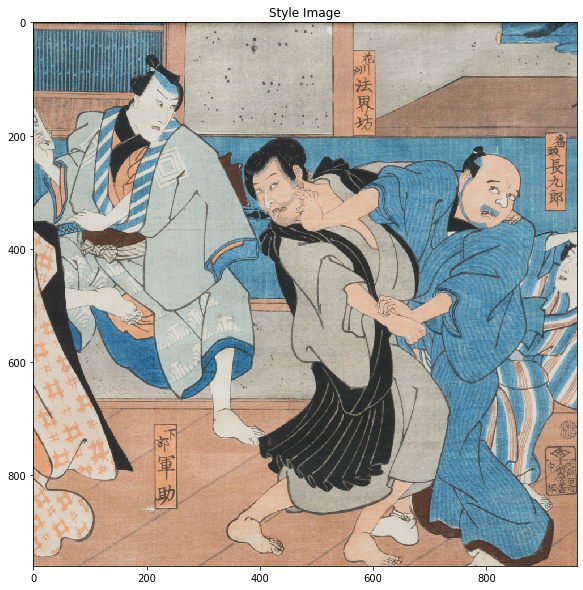

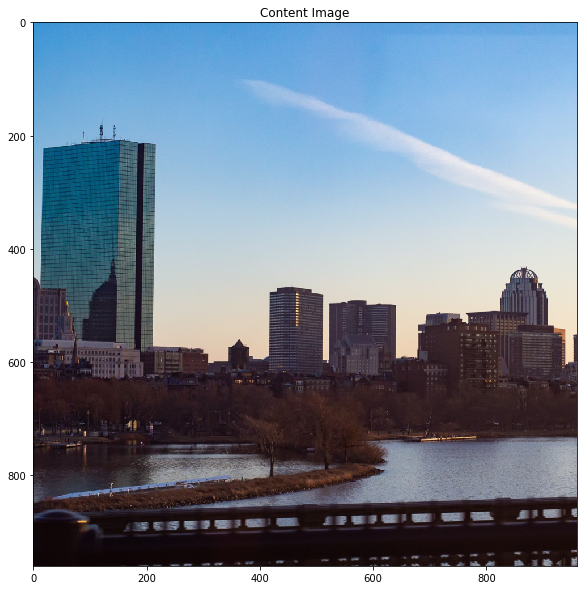

In [6]:
unloader = transforms.ToPILImage()

plt.ion()

def imshow(tensor, title=None):
    image = tensor.cpu().clone()
    image = image.squeeze(0)
    image = unloader(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)
    
plt.figure()
imshow(style_img, title="Style Image")

plt.figure()
imshow(content_img, title="Content Image")

In [7]:
class ContentLoss(nn.Module):
    def __init__(self, target, ):
        super(ContentLoss, self).__init__()
        self.target = target.detach()
        
    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input

In [8]:
def gram_matrix(input):
    batch_size, num_feature_maps, feature_map_ncols, feature_map_nrows = input.size()
    
    features = input.view(batch_size * num_feature_maps, feature_map_ncols * feature_map_nrows)
    
    G = torch.mm(features, features.t())
    
    return G.div(batch_size * num_feature_maps * feature_map_ncols * feature_map_nrows)

In [9]:
class StyleLoss(nn.Module):
    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()
    
    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input

In [10]:
cnn = models.vgg19(pretrained=True).features.to(device).eval()

In [11]:
cnn_normalization_mean = torch.as_tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std =  torch.as_tensor([0.229, 0.224, 0.225]).to(device)

In [12]:
class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        self.mean = torch.as_tensor(mean).view(-1, 1, 1)
        self.std = torch.as_tensor(std).view(-1, 1, 1)
    
    def forward(self, img):
        # Normalize img by subtracting mean and dividing by stddev
        return (img - self.mean) / self.std

In [13]:
content_layers_default = ['conv_4']
style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

def get_style_model_and_losses(cnn, normalization_mean, normalization_std, style_img, content_img,
                              content_layers=content_layers_default,
                              style_layers=style_layers_default):
    cnn = copy.deepcopy(cnn)
    
    normalization = Normalization(normalization_mean, normalization_std).to(device)
    
    content_losses = []
    style_losses = []
    
    model = nn.Sequential(normalization)
    
    i = 0
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = f'conv_{i}'
        elif isinstance(layer, nn.ReLU):
            name = f'relu_{i}'
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = f'pool_{i}'
        elif isinstance(layer, nn.BatchNorm2d):
            name = f'bn_{i}'
        else:
            raise RuntimeError(f'Unrecognized Layer: {layer.__class__.__name__}')
        
        model.add_module(name, layer)
        
        if name in content_layers:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module(f'content_loss_{i}', content_loss)
            content_losses.append(content_loss)
            
        if name in style_layers:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module(f'style_loss_{i}', style_loss)
            style_losses.append(style_loss)
            
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break
    model = model[:(i + 1)]

    return model, style_losses, content_losses

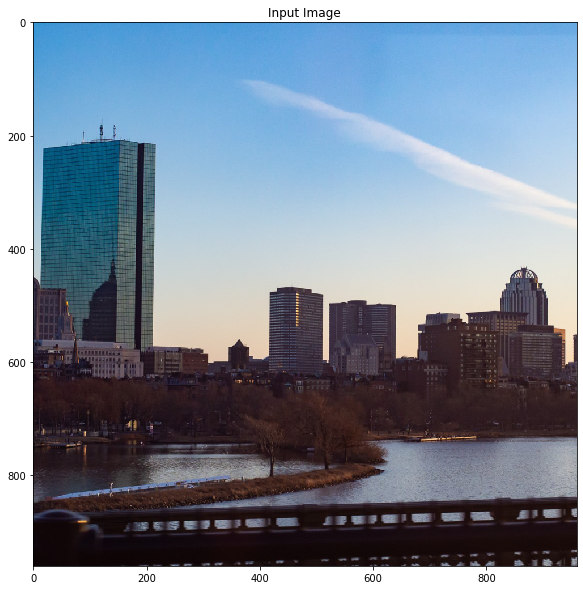

In [14]:
input_img = content_img.clone()

plt.figure()
imshow(input_img, title='Input Image')

# Gradient Descent

In [15]:
def get_input_optimizer(input_img):
    optimizer = optim.LBFGS([input_img.requires_grad_()])
    return optimizer

In [16]:
def run_style_transfer(cnn, normalization_mean, normalization_std,
                       content_img, style_img, imput_img, num_steps=300,
                       style_weight=1e7, content_weight=1):
    
    print('Building the style transfer model...')
    model, style_losses, content_losses = get_style_model_and_losses(cnn, 
                                                                     normalization_mean, normalization_std, 
                                                                     style_img, content_img)
    optimizer = get_input_optimizer(input_img)
    
    print('Optimizing...')
    run = [0]
    
    while run[0] <= num_steps:
        def closure():
            input_img.data.clamp_(0, 1)
            
            optimizer.zero_grad()
            model(input_img)
            style_score = 0
            content_score = 0
            
            for sl in style_losses:
                style_score += sl.loss
            for cl in content_losses:
                content_score += cl.loss
            
            style_score *= style_weight
            content_score *= content_weight
            
            loss = style_score + content_score
            loss.backward()
            
            run[0] += 1
            if run[0] % 50 == 0:
                print(f'run {run}')
                print(f'Style Loss: {style_score.item():4f}, Content Loss: {content_score.item():4f}')
                print()
            
            return style_score + content_score
        
        optimizer.step(closure)
    
    input_img.data.clamp_(0, 1)
    
    return input_img

# Let's Go Baby

In [17]:
style_weight = 1e7
content_weight = 10
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std, 
                            content_img, style_img, input_img, style_weight=style_weight, content_weight=content_weight)

Building the style transfer model...
Optimizing...
run [50]
Style Loss: 422.121460, Content Loss: 91.284546

run [100]
Style Loss: 124.864594, Content Loss: 94.904282

run [150]
Style Loss: 66.286003, Content Loss: 83.393280

run [200]
Style Loss: 41.176250, Content Loss: 74.010231

run [250]
Style Loss: 25.810495, Content Loss: 67.899620

run [300]
Style Loss: 16.549015, Content Loss: 63.000675



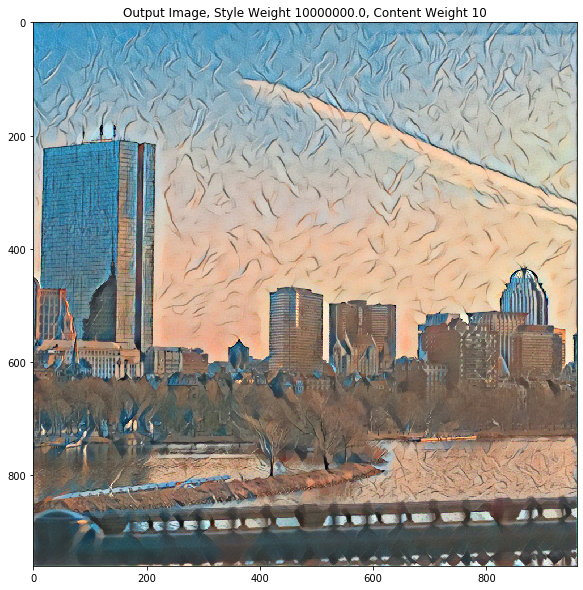

In [18]:
plt.figure()
imshow(output, title=f'Output Image, Style Weight {style_weight}, Content Weight {content_weight}')

plt.ioff()
plt.show()

In [19]:
style_weight = 1e7
content_weight = 1
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std, 
                            content_img, style_img, input_img, style_weight=style_weight, content_weight=content_weight)

Building the style transfer model...
Optimizing...
run [50]
Style Loss: 9.307906, Content Loss: 7.040842

run [100]
Style Loss: 6.596194, Content Loss: 7.475316

run [150]
Style Loss: 4.794775, Content Loss: 7.571306

run [200]
Style Loss: 3.527835, Content Loss: 7.476820

run [250]
Style Loss: 2.620648, Content Loss: 7.346051

run [300]
Style Loss: 1.974924, Content Loss: 7.216668



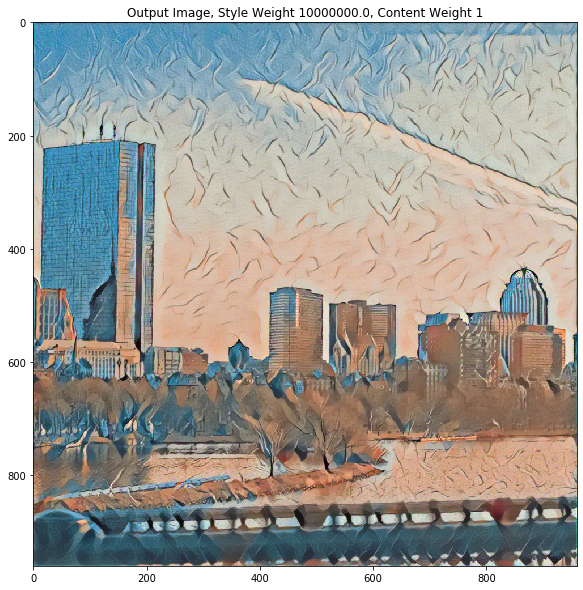

In [20]:
plt.figure()
imshow(output, title=f'Output Image, Style Weight {style_weight}, Content Weight {content_weight}')

plt.ioff()
plt.show()

In [21]:
style_weight = 1e6
content_weight = 1
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std, 
                            content_img, style_img, input_img, style_weight=style_weight, content_weight=content_weight)

Building the style transfer model...
Optimizing...
run [50]
Style Loss: 0.470604, Content Loss: 6.112149

run [100]
Style Loss: 0.521858, Content Loss: 5.736454

run [150]
Style Loss: 0.539755, Content Loss: 5.539942

run [200]
Style Loss: 0.544473, Content Loss: 5.406111

run [250]
Style Loss: 0.537727, Content Loss: 5.313098

run [300]
Style Loss: 0.526416, Content Loss: 5.243611



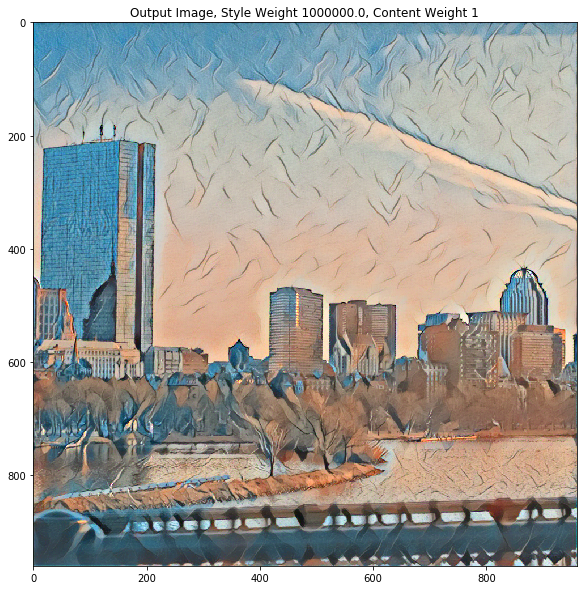

In [22]:
plt.figure()
imshow(output, title=f'Output Image, Style Weight {style_weight}, Content Weight {content_weight}')

plt.ioff()
plt.show()

In [23]:
style_weight = 1e8
content_weight = 1
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std, 
                            content_img, style_img, input_img, style_weight=style_weight, content_weight=content_weight)

Building the style transfer model...
Optimizing...
run [50]
Style Loss: 25.233788, Content Loss: 6.260647

run [100]
Style Loss: 15.789576, Content Loss: 7.063637

run [150]
Style Loss: 11.192546, Content Loss: 7.532358

run [200]
Style Loss: 8.554741, Content Loss: 7.791473

run [250]
Style Loss: 6.865763, Content Loss: 7.913979

run [300]
Style Loss: 5.543395, Content Loss: 8.021812



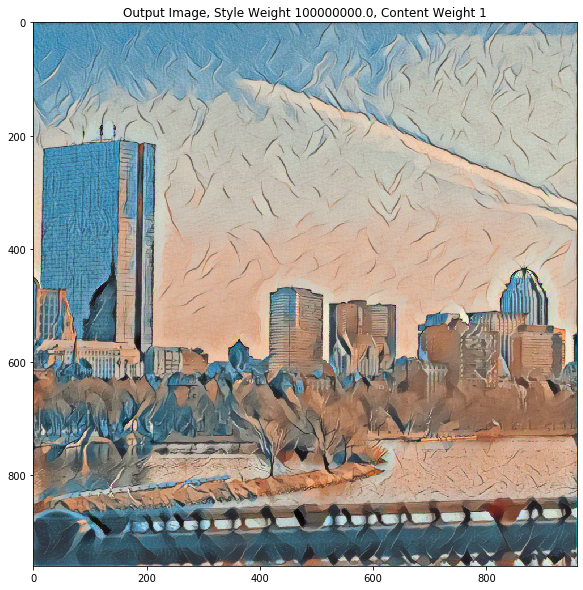

In [24]:
plt.figure()
imshow(output, title=f'Output Image, Style Weight {style_weight}, Content Weight {content_weight}')

plt.ioff()
plt.show()

In [25]:
style_weight = 1e8
content_weight = 0.1
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std, 
                            content_img, style_img, input_img, style_weight=style_weight, content_weight=content_weight)

Building the style transfer model...
Optimizing...
run [50]
Style Loss: 4.770238, Content Loss: 0.810628

run [100]
Style Loss: 4.145870, Content Loss: 0.834460

run [150]
Style Loss: 3.642893, Content Loss: 0.858784

run [200]
Style Loss: 3.093137, Content Loss: 0.882813

run [250]
Style Loss: 2.612404, Content Loss: 0.904547

run [300]
Style Loss: 2.176841, Content Loss: 0.920161



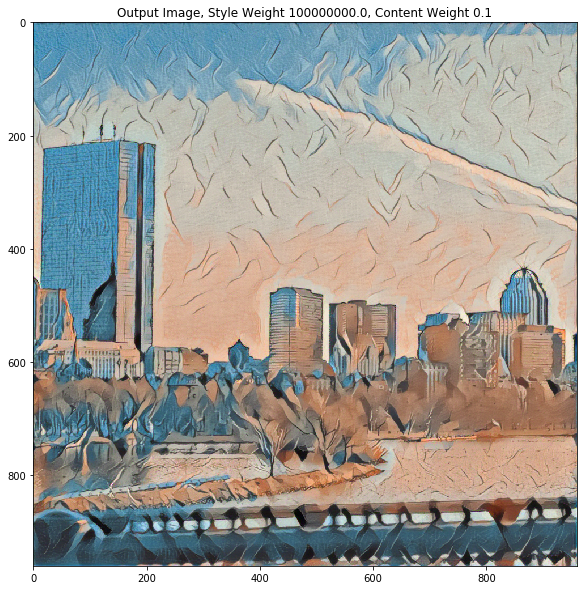

In [26]:
plt.figure()
imshow(output, title=f'Output Image, Style Weight {style_weight}, Content Weight {content_weight}')

plt.ioff()
plt.show()

In [27]:
style_weight = 1e7
content_weight = 0.01
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std, 
                            content_img, style_img, input_img, style_weight=style_weight, content_weight=content_weight)

Building the style transfer model...
Optimizing...
run [50]
Style Loss: 0.190958, Content Loss: 0.092592

run [100]
Style Loss: 0.174945, Content Loss: 0.092230

run [150]
Style Loss: 0.161092, Content Loss: 0.091849

run [200]
Style Loss: 0.146161, Content Loss: 0.091501

run [250]
Style Loss: 0.130963, Content Loss: 0.091246

run [300]
Style Loss: 0.115894, Content Loss: 0.091167



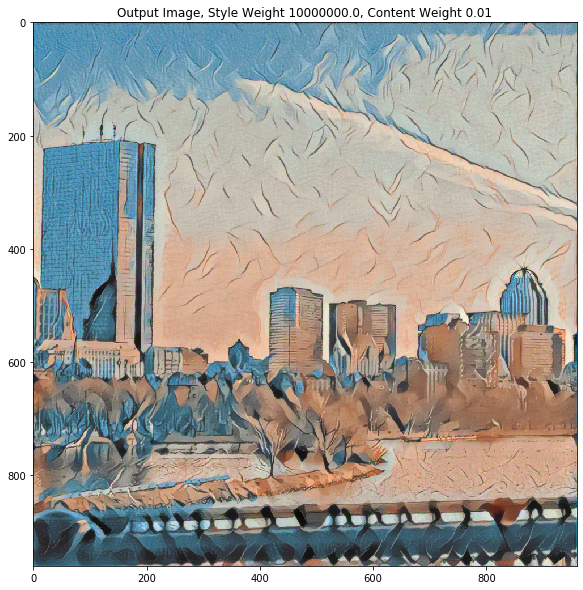

In [28]:
plt.figure()
imshow(output, title=f'Output Image, Style Weight {style_weight}, Content Weight {content_weight}')

plt.ioff()
plt.show()

In [29]:
%time
style_weight = 1e7
content_weight = 0.001
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std, 
                            content_img, style_img, input_img, style_weight=style_weight, content_weight=content_weight)

Wall time: 0 ns
Building the style transfer model...
Optimizing...
run [50]
Style Loss: 0.104890, Content Loss: 0.009141

run [100]
Style Loss: 0.097452, Content Loss: 0.009213

run [150]
Style Loss: 0.090945, Content Loss: 0.009301

run [200]
Style Loss: 0.083475, Content Loss: 0.009420

run [250]
Style Loss: 0.076165, Content Loss: 0.009552

run [300]
Style Loss: 0.069265, Content Loss: 0.009671



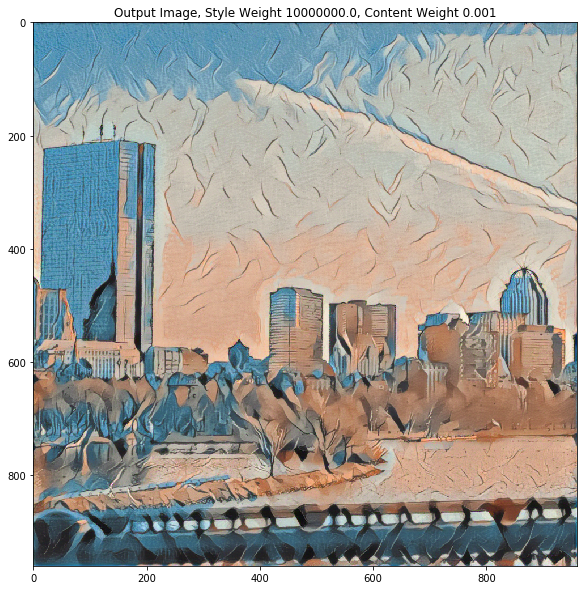

In [30]:
plt.figure()
imshow(output, title=f'Output Image, Style Weight {style_weight}, Content Weight {content_weight}')

plt.ioff()
plt.show()

In [31]:
%%time
style_weight = 1e7
content_weight = 0.0001
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std, 
                            content_img, style_img, input_img, style_weight=style_weight, content_weight=content_weight)

Building the style transfer model...
Optimizing...
run [50]
Style Loss: 0.064909, Content Loss: 0.000972

run [100]
Style Loss: 0.061286, Content Loss: 0.000971

run [150]
Style Loss: 0.058468, Content Loss: 0.000971

run [200]
Style Loss: 0.054363, Content Loss: 0.000972

run [250]
Style Loss: 0.050084, Content Loss: 0.000973

run [300]
Style Loss: 0.046598, Content Loss: 0.000975

Wall time: 1min 58s


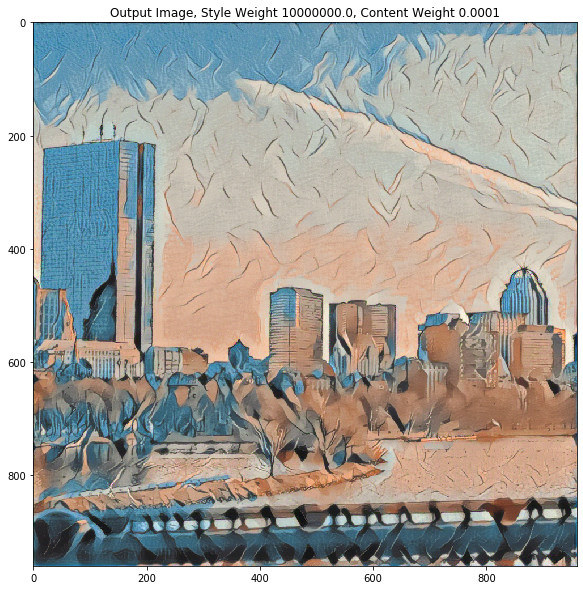

In [32]:
plt.figure()
imshow(output, title=f'Output Image, Style Weight {style_weight}, Content Weight {content_weight}')

plt.ioff()
plt.show()

In [33]:
%%time
style_weight = 1e7
content_weight = 0.00001
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std, 
                            content_img, style_img, input_img, style_weight=style_weight, content_weight=content_weight)

Building the style transfer model...
Optimizing...
run [50]
Style Loss: 0.043607, Content Loss: 0.000098

run [100]
Style Loss: 0.041503, Content Loss: 0.000098

run [150]
Style Loss: 0.039832, Content Loss: 0.000098

run [200]
Style Loss: 0.037618, Content Loss: 0.000099

run [250]
Style Loss: 0.035417, Content Loss: 0.000099

run [300]
Style Loss: 0.033409, Content Loss: 0.000100

Wall time: 1min 58s


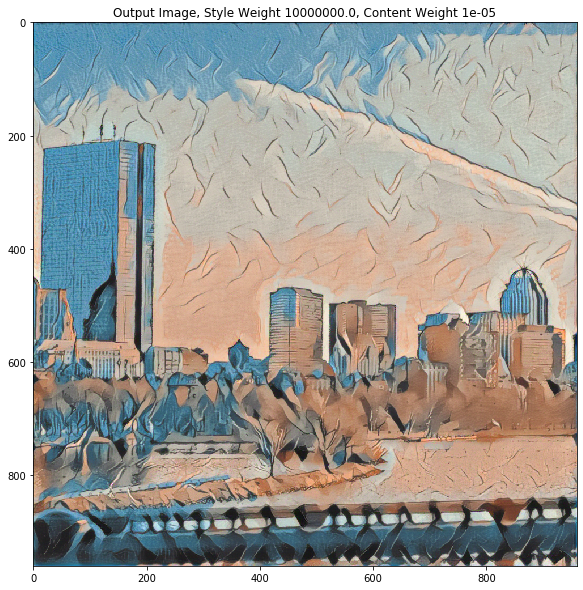

In [34]:
plt.figure()
imshow(output, title=f'Output Image, Style Weight {style_weight}, Content Weight {content_weight}')

plt.ioff()
plt.show()

In [35]:
style_weight = 1e7
content_weight = 2
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std, 
                            content_img, style_img, input_img, style_weight=style_weight, content_weight=content_weight)

Building the style transfer model...
Optimizing...
run [50]
Style Loss: 0.673164, Content Loss: 15.653666

run [100]
Style Loss: 0.646060, Content Loss: 14.069045

run [150]
Style Loss: 0.717898, Content Loss: 13.137361

run [200]
Style Loss: 0.737357, Content Loss: 12.665481

run [250]
Style Loss: 0.762491, Content Loss: 12.355858

run [300]
Style Loss: 0.771454, Content Loss: 12.160635



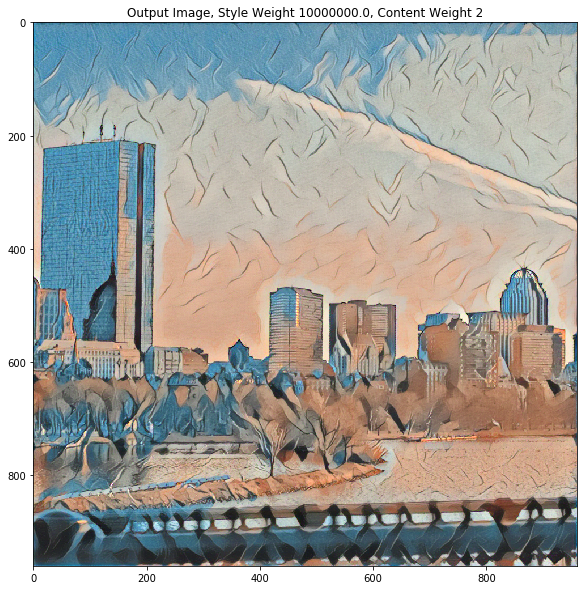

In [36]:
plt.figure()
imshow(output, title=f'Output Image, Style Weight {style_weight}, Content Weight {content_weight}')

plt.ioff()
plt.show()

In [37]:
style_weight = 1e7
content_weight = 100
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std, 
                            content_img, style_img, input_img, style_weight=style_weight, content_weight=content_weight)

Building the style transfer model...
Optimizing...
run [50]
Style Loss: 38.578629, Content Loss: 451.224854

run [100]
Style Loss: 46.019386, Content Loss: 414.666077

run [150]
Style Loss: 48.909004, Content Loss: 399.720703

run [200]
Style Loss: 52.083324, Content Loss: 391.641113

run [250]
Style Loss: 55.770287, Content Loss: 390.020050

run [300]
Style Loss: 58.387627, Content Loss: 387.898285



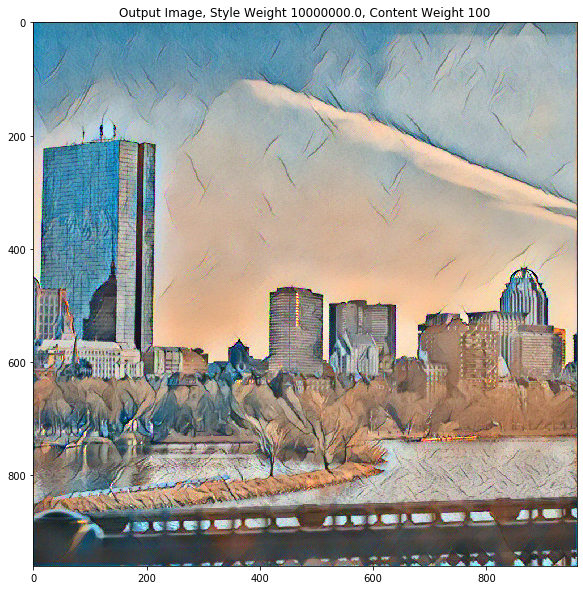

In [38]:
plt.figure()
imshow(output, title=f'Output Image, Style Weight {style_weight}, Content Weight {content_weight}')

plt.ioff()
plt.show()

In [39]:
style_weight = 1e7
content_weight = 500
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std, 
                            content_img, style_img, input_img, style_weight=style_weight, content_weight=content_weight)

Building the style transfer model...
Optimizing...
run [50]
Style Loss: 301.268799, Content Loss: 1408.659424

run [100]
Style Loss: 342.683807, Content Loss: 1382.553711

run [150]
Style Loss: 28345438.000000, Content Loss: 80346.843750

run [200]
Style Loss: 193568304.000000, Content Loss: 206608.562500

run [250]
Style Loss: 2452.474121, Content Loss: 4306.248535

run [300]
Style Loss: 949.156250, Content Loss: 2157.007080



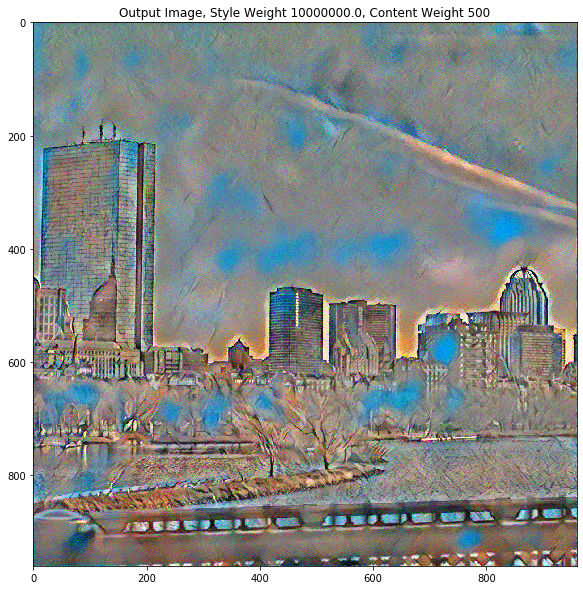

In [40]:
plt.figure()
imshow(output, title=f'Output Image, Style Weight {style_weight}, Content Weight {content_weight}')

plt.ioff()
plt.show()

In [41]:
style_weight = 1e7
content_weight = 1000
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std, 
                            content_img, style_img, input_img, style_weight=style_weight, content_weight=content_weight)

Building the style transfer model...
Optimizing...
run [50]
Style Loss: 948.395752, Content Loss: 2571.579590

run [100]
Style Loss: 819.119202, Content Loss: 2418.226562

run [150]
Style Loss: 765.554565, Content Loss: 2346.801514

run [200]
Style Loss: 794.604248, Content Loss: 2401.282471

run [250]
Style Loss: 860.286682, Content Loss: 2462.184814

run [300]
Style Loss: 943.227356, Content Loss: 2549.939453



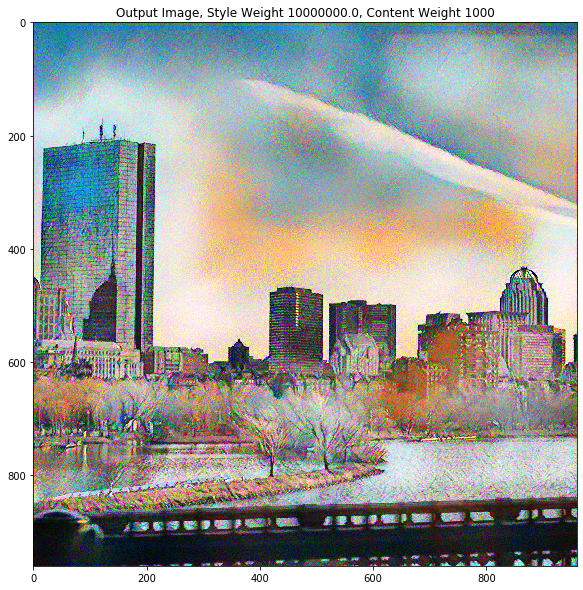

In [42]:
plt.figure()
imshow(output, title=f'Output Image, Style Weight {style_weight}, Content Weight {content_weight}')

plt.ioff()
plt.show()

In [43]:
style_weight = 1e6
content_weight = 1000
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std, 
                            content_img, style_img, input_img, style_weight=style_weight, content_weight=content_weight)

Building the style transfer model...
Optimizing...
run [50]
Style Loss: 576.161926, Content Loss: 839.598389

run [100]
Style Loss: 587.403320, Content Loss: 709.662842

run [150]
Style Loss: 587.495483, Content Loss: 651.381409

run [200]
Style Loss: 589.056519, Content Loss: 614.396851

run [250]
Style Loss: 596.487671, Content Loss: 586.739258

run [300]
Style Loss: 603.239563, Content Loss: 567.493103



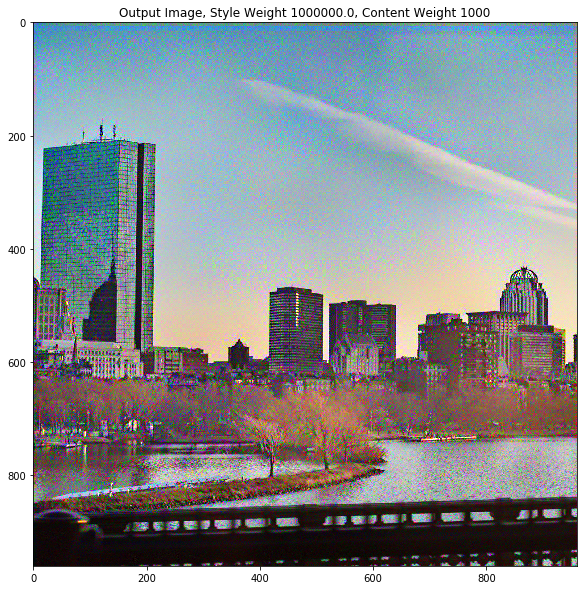

In [44]:
plt.figure()
imshow(output, title=f'Output Image, Style Weight {style_weight}, Content Weight {content_weight}')

plt.ioff()
plt.show()